In [1]:
import torch
torch.cuda.memory_cached()
import os
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import pandas as pd
from torch.utils.data import Dataset, DataLoader, Subset
# from torchvision import transforms
from PIL import Image
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
import optuna
import sys
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torchvision.transforms.functional import to_tensor, to_pil_image
import best_modelo_general as bmg
import best_modelo_general_colon as bmgc
import best_modelo_general_lung as bmgl
import best_modelo_general_gastrointestinal as bmgg
import best_modelo_general_oral as bmgo

# Aca va el optmizador de profundidad
import opt_deep_analysis as opt_deep

sys.path.append("C:/Users/Matias/Desktop/Tesis/Tesis-Codes/utils")
import creacion_df_torch as qol



dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"

# Preparar datos
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='all')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=80, m_type='bin')

#Preparamos
import os
import pandas as pd

# Ruta al directorio del dataset
dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"


# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\gastrointestinal_ACA_TUM-VWQKTKMAKTCA.png


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(


                                                ruta etiqueta tipo_cancer
0  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
1  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
2  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
3  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
4  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
                                                     ruta etiqueta tipo_cancer
count                                               46464    46464       46464
unique                                              46464        2           4
top     C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno        lung
freq                                                    1    29274       15000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46464 entries, 0 to 46463
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------ 

c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


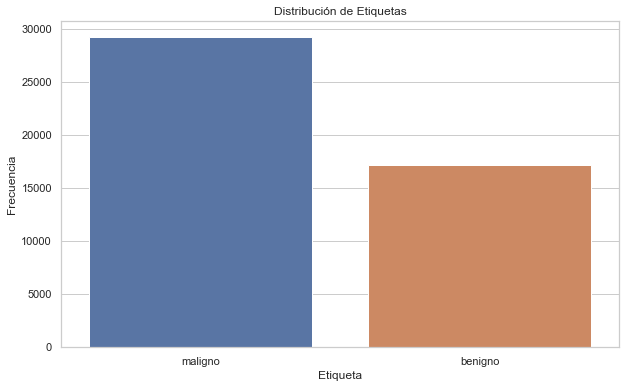

c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


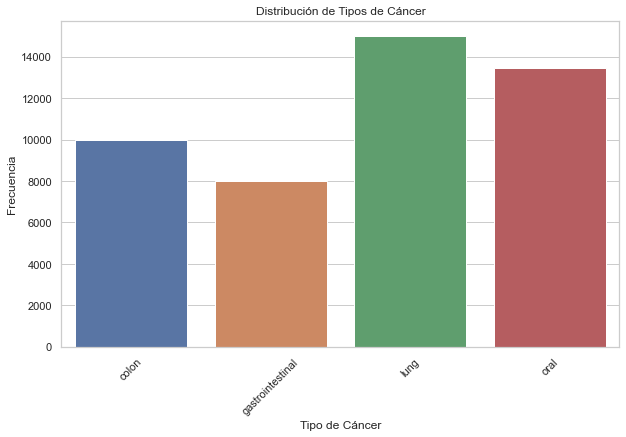

Datos Faltantes por Columna:
ruta           0
etiqueta       0
tipo_cancer    0
dtype: int64


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import numpy as np

# Crear DataFrame desde el directorio del dataset
# Asumiendo que qol.crear_dataframe_binario(dataset_dir) devuelve un DataFrame con al menos las columnas 'path', 'etiqueta' y 'tipo_cancer'

dataframe = qol.crear_dataframe_binario(dataset_dir)

# Mostrar primeras filas del DataFrame
print(dataframe.head())

# Mostrar resumen estadístico del DataFrame
print(dataframe.describe(include='all'))

# Mostrar información del DataFrame
print(dataframe.info())

# Mostrar nombres de las columnas del DataFrame
print("Columnas del DataFrame:")
print(dataframe.columns)

# Mostrar distribución de la columna 'etiqueta'
print("Distribución de Etiquetas:")
print(dataframe['etiqueta'].value_counts())

# Mostrar distribución de la columna 'tipo_cancer'
print("Distribución de Tipos de Cáncer:")
print(dataframe['tipo_cancer'].value_counts())

# Configurar estilo de los gráficos
sns.set(style="whitegrid")

# Distribución de la columna 'etiqueta'
plt.figure(figsize=(10, 6))
sns.countplot(dataframe['etiqueta'])
plt.title('Distribución de Etiquetas')
plt.xlabel('Etiqueta')
plt.ylabel('Frecuencia')
plt.show()

# Distribución de la columna 'tipo_cancer'
plt.figure(figsize=(10, 6))
sns.countplot(dataframe['tipo_cancer'])
plt.title('Distribución de Tipos de Cáncer')
plt.xlabel('Tipo de Cáncer')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.show()

# Mostrar la cantidad de datos faltantes por columna
missing_values = dataframe.isnull().sum()
print("Datos Faltantes por Columna:")
print(missing_values)





### Redes preentrenadas

In [3]:
import pandas as pd
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50, VGG16, DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pickle
from sklearn.model_selection import train_test_split

def crear_dataframe(dataset_dir):
    subcarpetas = ['benigno', 'maligno']
    data = {'ruta': [], 'etiqueta': [], 'tipo': []}
    
    for subcarpeta in subcarpetas:
        dir_path = os.path.join(dataset_dir, subcarpeta)
        for filename in os.listdir(dir_path):
            parts = filename.split('_')
            
            if len(parts) > 2 and (parts[0] == 'oral'):
                tipo_cancer = parts[0]
                etiqueta = parts[1]
            elif len(parts) == 3:
                tipo_cancer, etiqueta, _ = parts
            else:
                print(f"Archivo {filename} ignorado por tener un formato incorrecto.")
                continue
                
            ruta_completa = os.path.join(dir_path, filename)
            data['ruta'].append(ruta_completa)
            data['etiqueta'].append(etiqueta)
            data['tipo'].append(tipo_cancer)
    
    return pd.DataFrame(data)

def dividir_dataframe(df, test_size=0.2, val_size=0.25, random_state=42):
    df_train, df_temp = train_test_split(df, test_size=test_size, random_state=random_state)
    df_val, df_test = train_test_split(df_temp, test_size=val_size, random_state=random_state)
    return df_train, df_val, df_test

def crear_generadores_por_tipo(df_train, df_val, target_size=(256, 256), batch_size=20):
    datagen = ImageDataGenerator(rescale=1./255)
    
    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=True
    )
    
    validation_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )
    
    return train_generator, validation_generator

def crear_generador_test(df_test, target_size=(256, 256), batch_size=20):
    datagen = ImageDataGenerator(rescale=1./255)
    
    test_generator = datagen.flow_from_dataframe(
        dataframe=df_test,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )
    
    return test_generator

# Función para calcular métricas
def calcular_metricas(model, generator):
    y_true = generator.classes
    y_pred_prob = model.predict(generator)
    y_pred = (y_pred_prob > 0.5).astype(int)

    accuracy = accuracy_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    
    return accuracy, recall, precision, f1

def get_pretrained_model(model_name, input_shape=(256, 256, 3), num_classes=1):
    if model_name == 'resnet':
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'vgg':
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'densenet':
        base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError("Unsupported model name")

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    predictions = Dense(num_classes, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    for layer in base_model.layers:
        layer.trainable = False

    return model

def entrenar_modelo(model, train_gen, val_gen, tipo_cancer, model_name, epochs=30):
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    history = model.fit(train_gen,
                        epochs=epochs,
                        validation_data=val_gen)

    model_dir = f'C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/Model_Analsis_final/{tipo_cancer}_pretrained_models'
    os.makedirs(model_dir, exist_ok=True)
    model.save(os.path.join(model_dir, f'{tipo_cancer}_modelo_{model_name}.h5'))
    
    with open(os.path.join(model_dir, f'{tipo_cancer}_historial_{model_name}.pickle'), 'wb') as f:
        pickle.dump(history.history, f)
    
    return model, history

def ocultar_seccion(imagen, top_left, tamano, valor_ocultacion=0.5):
    imagen_modificada = np.copy(imagen)
    x, y = top_left
    ancho, alto = tamano
    imagen_modificada[y:y+alto, x:x+ancho, :] = valor_ocultacion
    return imagen_modificada

def generar_mostrar_mapa_calor(ruta_imagen, modelo, tamano_parche=32, paso=16):
    partes_ruta = ruta_imagen.split('/')  
    clase_real = partes_ruta[-2]

    imagen = load_img(ruta_imagen, target_size=(256, 256))
    imagen_array = img_to_array(imagen) / 255.0
    mapa_calor = np.zeros((imagen_array.shape[0], imagen_array.shape[1]))

    prediccion_original = modelo.predict(np.expand_dims(imagen_array, axis=0), verbose=0)[0][0]
    clase_predicha = 'maligno' if prediccion_original > 0.5 else 'benigno'

    for y in range(0, imagen_array.shape[0] - tamano_parche, paso):
        for x in range(0, imagen_array.shape[1] - tamano_parche, paso):
            imagen_modificada = ocultar_seccion(imagen_array, (x, y), (tamano_parche, tamano_parche))
            prediccion_modificada = modelo.predict(np.expand_dims(imagen_modificada, axis=0), verbose=0)[0][0]
            cambio_prediccion = np.abs(prediccion_original - prediccion_modificada)
            mapa_calor[y:y+tamano_parche, x:x+tamano_parche] += cambio_prediccion

    mapa_calor = mapa_calor / np.max(mapa_calor)

    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    
    axs[0].imshow(imagen)
    axs[0].set_title(f'Original - Real: {clase_real}, Predicha: {clase_predicha}')
    axs[0].axis('off')
    
    axs[1].imshow(imagen)
    axs[1].imshow(mapa_calor, cmap='jet', alpha=0.5)
    axs[1].set_title(f'Mapa de Calor {modelo}')
    axs[1].axis('off')
    
    plt.show()






# Modelos ya entrenados previamente 


In [ ]:
'''model_bmg= bmg.Net()
model_bmg.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt', map_location="cuda:0"))


model_bmgc= bmg.Net()
model_bmgc.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt', map_location="cuda:0"))

model_bmgl= bmg.Net()
model_bmgl.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt', map_location="cuda:0"))

model_bmgo= bmg.Net()
model_bmgo.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt', map_location="cuda:0"))

'''





'model_bmg= bmg.Net()\nmodel_bmg.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt\', map_location="cuda:0"))\n\n\nmodel_bmgc= bmg.Net()\nmodel_bmgc.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt\', map_location="cuda:0"))\n\nmodel_bmgl= bmg.Net()\nmodel_bmgl.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt\', map_location="cuda:0"))\n\nmodel_bmgo= bmg.Net()\nmodel_bmgo.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt\', map_location="cuda:0"))\n\n'

# Modelos Binarios Cancer-No Cancer

## Modelo General 4 tipos de Cancer

### Mejor modelo iteraciones

In [4]:

# Entrenar modelo
model_bmg = bmg.train_model(device, train_loader, val_loader)
#Cargamos el modelo si ya lo tenemos entrenado
# Guardar el estado del diccionario de cada modelo
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmg, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9227
Test Accuracy: 0.9211
Final Test Accuracy: 0.9211
Validation Accuracy: 0.9227
Test Accuracy: 0.9211
Final Validation Metrics: Accuracy=0.9227, Recall=0.9061, Precision=0.9277, F1=0.9151
Final Test Metrics: Accuracy=0.9211, Recall=0.9049, Precision=0.9253, F1=0.9134


In [4]:
import matplotlib.pyplot as plt

# Listas para almacenar las métricas
train_accuracies = []
val_accuracies = []
train_losses = []
val_losses = []

num_epochs = 10
# Entrenar modelo
for epoch in range(num_epochs):
    # Entrenamiento
    train_loss, train_accuracy = bmg.train_one_epoch(device, train_loader, model_bmg, optim.Adam(model.parameters(), lr=0.0004701163660665632))
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    
    # Validación
    val_loss, val_accuracy = bmg.validate_one_epoch(device, val_loader, model_bmg)
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

# Guardar el modelo
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')


AttributeError: module 'best_modelo_general' has no attribute 'train_one_epoch'

# Optimizacion profundidad

In [ ]:
# Definir el estudio
try:
    study_general = optuna.create_study(storage="sqlite:///general_model_opt_deep.db", study_name="Estudio Clasificador General Deep",direction='maximize')
    study_general.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=80000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_general.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'general_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('general_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-10-07 02:41:42,973] A new study created in RDB with name: Estudio Clasificador General Deep
[I 2024-10-07 02:46:46,779] Trial 0 finished with value: 1.0 and parameters: {'num_layers': 5, 'num_fc_layers': 1, 'num_filters_layer0': 32, 'num_filters_layer1': 32, 'num_filters_layer2': 64, 'num_filters_layer3': 32, 'num_filters_layer4': 64, 'kernel_size': 2, 'dropout_rate': 0.20243452810484186, 'learning_rate': 0.00012922304726270276, 'batch_size': 30, 'steps_per_epoch': 117, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 1.0.
[I 2024-10-07 02:57:05,372] Trial 1 finished with value: 1.0 and parameters: {'num_layers': 2, 'num_fc_layers': 2, 'num_filters_layer0': 128, 'num_filters_layer1': 128, 'kernel_size': 3, 'dropout_rate': 0.21770352768343526, 'learning_rate': 0.0006110652312968382, 'batch_size': 20, 'steps_per_epoch': 125, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 1.0.
[I 2024-10-07 03:10:27,182] Trial 2 finished with value: 1.0 and parameters: {'num_layers': 8, 

### Redes preentrenadas

DataFrames divididos con éxito
Found 36193 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 978 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Found 6777 validated image filenames belonging to 2 classes.
Found 2270 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 192 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 54 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/30


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1810/1810 ━━━━━━━━━━━━━━━━━━━━ 934s 514ms/step - accuracy: 0.6146 - loss: 0.6883 - val_accuracy: 0.6361 - val_loss: 0.6041
Epoch 2/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 941s 520ms/step - accuracy: 0.6874 - loss: 0.5925 - val_accuracy: 0.7223 - val_loss: 0.5306
Epoch 3/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 938s 518ms/step - accuracy: 0.7330 - loss: 0.5487 - val_accuracy: 0.7375 - val_loss: 0.5139
Epoch 4/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 938s 518ms/step - accuracy: 0.7472 - loss: 0.5284 - val_accuracy: 0.7831 - val_loss: 0.4966
Epoch 5/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 937s 518ms/step - accuracy: 0.7597 - loss: 0.5109 - val_accuracy: 0.7976 - val_loss: 0.4666
Epoch 6/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 939s 519ms/step - accuracy: 0.7665 - loss: 0.5046 - val_accuracy: 0.7753 - val_loss: 0.4770
Epoch 7/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 940s 519ms/step - accuracy: 0.7735 - loss: 0.4907 - val_accuracy: 0.7760 - val_loss: 0.4862
Epoch 8/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 942s 520ms/step - accuracy: 0.7

Modelo resnet entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 144s 420ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


114/114 ━━━━━━━━━━━━━━━━━━━━ 47s 413ms/step
Final Validation Metrics for resnet: Accuracy=0.8297, Recall=0.8440, Precision=0.8773, F1=0.8604
Final Test Metrics for resnet: Accuracy=0.8256, Recall=0.8333, Precision=0.8850, F1=0.8584


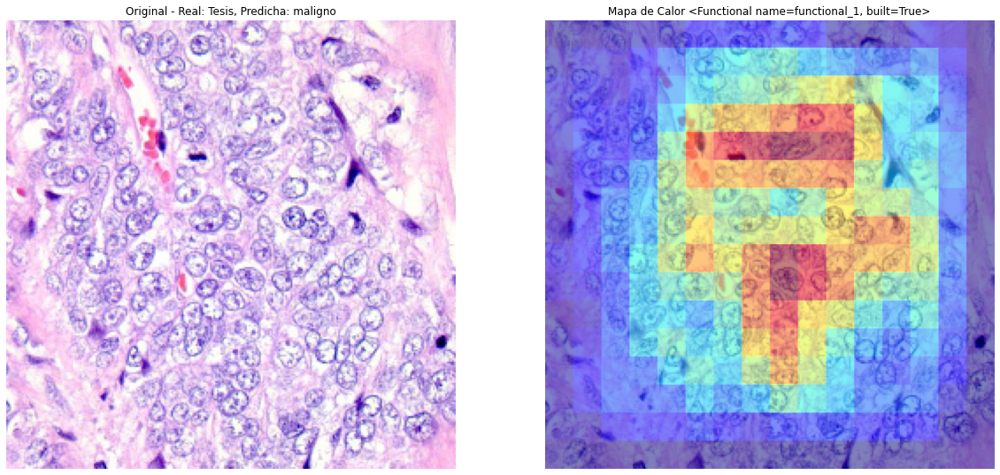

Entrenando el modelo vgg...
Epoch 1/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2270s 1s/step - accuracy: 0.8832 - loss: 0.2889 - val_accuracy: 0.9302 - val_loss: 0.1604
Epoch 2/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2281s 1s/step - accuracy: 0.9287 - loss: 0.1656 - val_accuracy: 0.9360 - val_loss: 0.1447
Epoch 3/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2284s 1s/step - accuracy: 0.9410 - loss: 0.1381 - val_accuracy: 0.9491 - val_loss: 0.1280
Epoch 4/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2286s 1s/step - accuracy: 0.9493 - loss: 0.1197 - val_accuracy: 0.9287 - val_loss: 0.1657
Epoch 5/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2303s 1s/step - accuracy: 0.9546 - loss: 0.1078 - val_accuracy: 0.9509 - val_loss: 0.1202
Epoch 6/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2307s 1s/step - accuracy: 0.9589 - loss: 0.0991 - val_accuracy: 0.9461 - val_loss: 0.1369
Epoch 7/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2310s 1s/step - accuracy: 0.9635 - loss: 0.0895 - val_accuracy: 0.9655 - val_loss: 0.0888
Epoch 8/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 2321s 

Modelo vgg entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 399s 1s/step
114/114 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step
Final Validation Metrics for vgg: Accuracy=0.9810, Recall=0.9905, Precision=0.9791, F1=0.9848
Final Test Metrics for vgg: Accuracy=0.9793, Recall=0.9868, Precision=0.9807, F1=0.9837


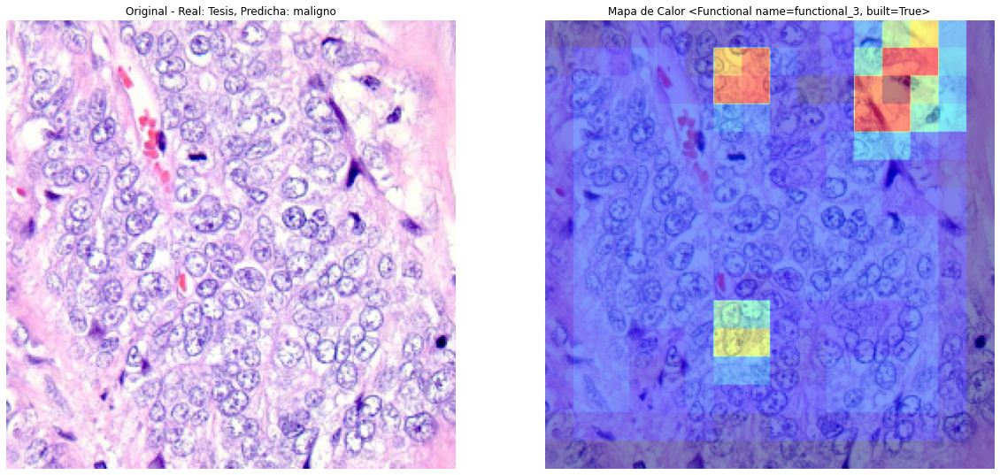

Entrenando el modelo densenet...
Epoch 1/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1168s 642ms/step - accuracy: 0.9156 - loss: 0.1965 - val_accuracy: 0.9593 - val_loss: 0.1010
Epoch 2/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1132s 625ms/step - accuracy: 0.9629 - loss: 0.0881 - val_accuracy: 0.9612 - val_loss: 0.0851
Epoch 3/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1129s 624ms/step - accuracy: 0.9772 - loss: 0.0568 - val_accuracy: 0.9770 - val_loss: 0.0602
Epoch 4/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1122s 620ms/step - accuracy: 0.9827 - loss: 0.0457 - val_accuracy: 0.9820 - val_loss: 0.0456
Epoch 5/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1123s 620ms/step - accuracy: 0.9863 - loss: 0.0340 - val_accuracy: 0.9810 - val_loss: 0.0560
Epoch 6/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1125s 622ms/step - accuracy: 0.9894 - loss: 0.0284 - val_accuracy: 0.9844 - val_loss: 0.0413
Epoch 7/30
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1121s 619ms/step - accuracy: 0.9917 - loss: 0.0240 - val_accuracy: 0.9777 - val_loss: 0.0600
Epoch 8/30
1810/1810 ━

Modelo densenet entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 161s 468ms/step
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 456ms/step
Final Validation Metrics for densenet: Accuracy=0.9895, Recall=0.9922, Precision=0.9910, F1=0.9916
Final Test Metrics for densenet: Accuracy=0.9846, Recall=0.9826, Precision=0.9930, F1=0.9878


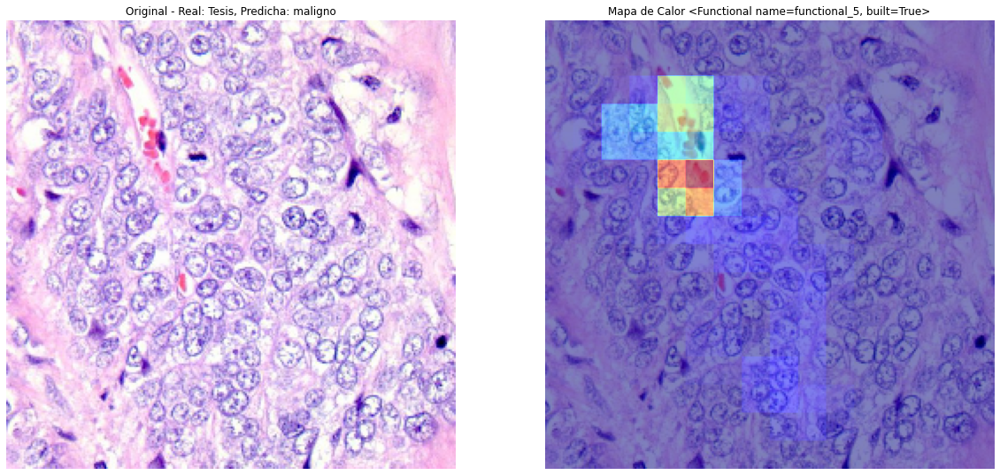

In [3]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)


## Modelo Binario Colon

In [4]:
df_colon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='colon')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_colon, test_size=0.3, random_state=46, stratify=df_colon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])

# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
train_loader_colon, val_loader_colon, test_loader_colon = qol.prepare_data_loaders(df_colon, batch_size=80, m_type='bin')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\colon_ACA_colonca528.jpeg


In [7]:

# Entrenar modelo
model_bmgc= bmgc.train_model(device, train_loader_colon, val_loader_colon)
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pth')
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgc, test_loader_colon)
print(f'Final Test Accuracy: {test_accuracy:.4f}')

try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgc, val_loader_colon, test_loader_colon)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\colon_ACA_colonca3638.jpeg
Validation Accuracy: 0.9851
Test Accuracy: 0.9808
Final Test Accuracy: 0.9808
Validation Accuracy: 0.9851
Test Accuracy: 0.9808
Final Validation Metrics: Accuracy=0.9851, Recall=0.9851, Precision=0.9851, F1=0.9851
Final Test Metrics: Accuracy=0.9808, Recall=0.9808, Precision=0.9808, F1=0.9808


In [3]:
# Definir el estudio
try:
    study_colon = optuna.create_study(storage="sqlite:///colon_model_opt_deep.db", study_name="Estudio Clasificador Colon Deep",direction='maximize')
    study_colon.optimize(lambda trial: opt_deep.objective(trial, cancer='colon'), n_trials=100)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_colon.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_colon:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'colon_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_colon:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('colon_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_colon:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-08-10 21:34:12,401] A new study created in RDB with name: Estudio Clasificador Colon Deep
[I 2024-08-10 21:38:56,037] Trial 0 finished with value: 0.6878322624164765 and parameters: {'num_layers': 6, 'num_fc_layers': 1, 'num_filters_layer0': 32, 'num_filters_layer1': 128, 'num_filters_layer2': 32, 'num_filters_layer3': 128, 'num_filters_layer4': 64, 'num_filters_layer5': 64, 'kernel_size': 2, 'dropout_rate': 0.24219321977905117, 'learning_rate': 0.0005052016858782067, 'batch_size': 20, 'steps_per_epoch': 151, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.6878322624164765.
[I 2024-08-10 21:42:43,021] Trial 1 finished with value: 0.7447601575714576 and parameters: {'num_layers': 4, 'num_fc_layers': 1, 'num_filters_layer0': 64, 'num_filters_layer1': 64, 'num_filters_layer2': 64, 'num_filters_layer3': 32, 'kernel_size': 3, 'dropout_rate': 0.24195397026598908, 'learning_rate': 0.00027211158264413385, 'batch_size': 20, 'steps_per_epoch': 110, 'optimizer': 'SGD'}. Best is trial 1

Final Test Accuracy: 0.9859
Final Test Recall: 0.9859
Final Test Precision: 0.9859
Final Test F1 Score: 0.9859


### Redes preentrenadas

DataFrames divididos con éxito
Found 8000 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/30


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


400/400 ━━━━━━━━━━━━━━━━━━━━ 195s 478ms/step - accuracy: 0.6517 - loss: 0.6625 - val_accuracy: 0.7800 - val_loss: 0.5059
Epoch 2/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 190s 474ms/step - accuracy: 0.7580 - loss: 0.5169 - val_accuracy: 0.7353 - val_loss: 0.5351
Epoch 3/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 189s 471ms/step - accuracy: 0.7677 - loss: 0.4993 - val_accuracy: 0.7020 - val_loss: 0.5501
Epoch 4/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 188s 471ms/step - accuracy: 0.7718 - loss: 0.4903 - val_accuracy: 0.7193 - val_loss: 0.5496
Epoch 5/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 189s 471ms/step - accuracy: 0.7793 - loss: 0.4776 - val_accuracy: 0.8147 - val_loss: 0.4438
Epoch 6/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 189s 471ms/step - accuracy: 0.7826 - loss: 0.4778 - val_accuracy: 0.8000 - val_loss: 0.4451
Epoch 7/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 189s 472ms/step - accuracy: 0.7972 - loss: 0.4499 - val_accuracy: 0.7693 - val_loss: 0.4762
Epoch 8/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 189s 471ms/step - accuracy: 0.7902 - loss: 0.45

Modelo resnet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 31s 403ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 397ms/step
Final Validation Metrics for resnet: Accuracy=0.8680, Recall=0.8886, Precision=0.8571, F1=0.8726
Final Test Metrics for resnet: Accuracy=0.8620, Recall=0.8554, Precision=0.8659, F1=0.8606


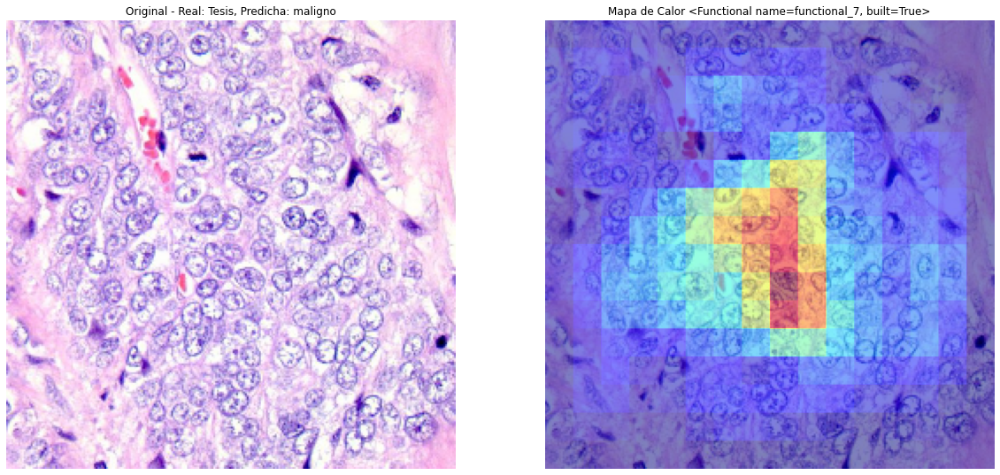

Entrenando el modelo vgg...
Epoch 1/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 439s 1s/step - accuracy: 0.9399 - loss: 0.1741 - val_accuracy: 0.9853 - val_loss: 0.0390
Epoch 2/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 439s 1s/step - accuracy: 0.9928 - loss: 0.0229 - val_accuracy: 0.9913 - val_loss: 0.0211
Epoch 3/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9948 - loss: 0.0142 - val_accuracy: 0.9953 - val_loss: 0.0111
Epoch 4/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9946 - loss: 0.0171 - val_accuracy: 0.9953 - val_loss: 0.0095
Epoch 5/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.9907 - val_loss: 0.0208
Epoch 6/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 441s 1s/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.9967 - val_loss: 0.0082
Epoch 7/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 438s 1s/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.9987 - val_loss: 0.0039
Epoch 8/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 439s 1s/step - accuracy: 0.99

Modelo vgg entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 71s 944ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 24s 967ms/step
Final Validation Metrics for vgg: Accuracy=0.9993, Recall=1.0000, Precision=0.9987, F1=0.9993
Final Test Metrics for vgg: Accuracy=0.9980, Recall=1.0000, Precision=0.9960, F1=0.9980


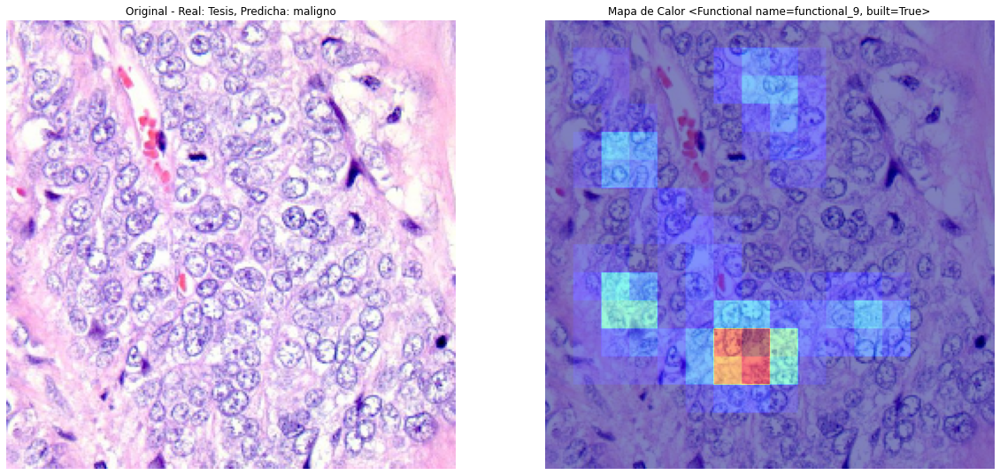

Entrenando el modelo densenet...
Epoch 1/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 251s 612ms/step - accuracy: 0.9526 - loss: 0.1089 - val_accuracy: 0.9987 - val_loss: 0.0060
Epoch 2/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 596ms/step - accuracy: 0.9956 - loss: 0.0103 - val_accuracy: 0.9993 - val_loss: 0.0027
Epoch 3/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 598ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.9987 - val_loss: 0.0034
Epoch 4/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 597ms/step - accuracy: 1.0000 - loss: 9.6608e-04 - val_accuracy: 0.9987 - val_loss: 0.0022
Epoch 5/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 597ms/step - accuracy: 1.0000 - loss: 5.1982e-04 - val_accuracy: 0.9987 - val_loss: 0.0027
Epoch 6/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 597ms/step - accuracy: 1.0000 - loss: 1.4864e-04 - val_accuracy: 0.9987 - val_loss: 0.0020
Epoch 7/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 239s 598ms/step - accuracy: 1.0000 - loss: 1.7477e-04 - val_accuracy: 1.0000 - val_loss: 8.4006e-04
Epoch 8/30
400/400 ━━━━

Modelo densenet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 41s 511ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 514ms/step
Final Validation Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_78616\3770877051.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


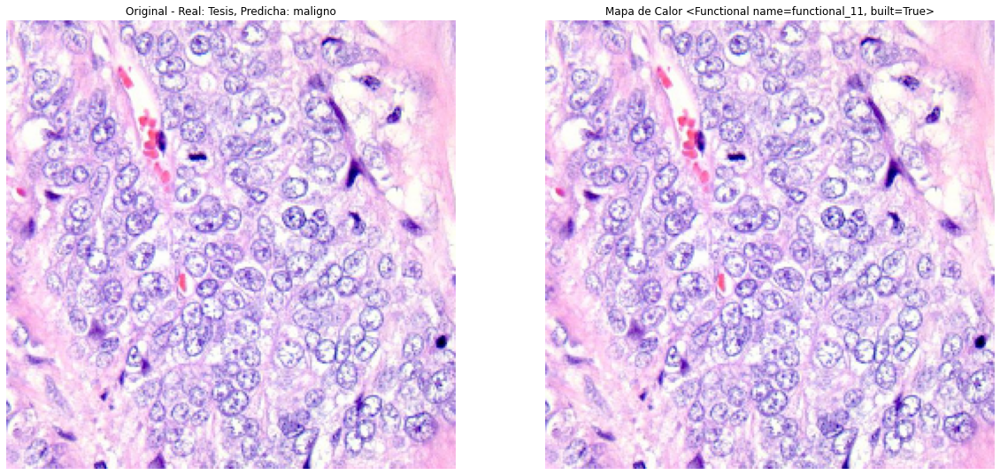

In [5]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_colon, df_val_colon, df_test_colon = dividir_dataframe(df_colon)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_colon, df_val_colon)
test_gen = crear_generador_test(df_test_colon)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'colon', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_colon['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Pulmon

In [4]:
df_pulmon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='lung')
train_loader_pulmon, val_loader_pulmon, test_loader_pulmon = qol.prepare_data_loaders(df_pulmon, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_pulmon, test_size=0.3, random_state=46, stratify=df_pulmon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
# Entrenar modelo

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\SCC\lung_SCC_lungscc4248.jpeg


In [11]:

model_bmgl= bmgl.train_model(device, train_loader_pulmon, val_loader_pulmon)
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pth')
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgl, test_loader_pulmon)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgl, val_loader_pulmon, test_loader_pulmon)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9983
Test Accuracy: 0.9973
Final Test Accuracy: 0.9973
Validation Accuracy: 0.9983
Test Accuracy: 0.9973
Final Validation Metrics: Accuracy=0.9983, Recall=0.9983, Precision=0.9980, F1=0.9981
Final Test Metrics: Accuracy=0.9973, Recall=0.9965, Precision=0.9975, F1=0.9970


In [5]:
# Definir el estudio
try:
    study_pulmon = optuna.create_study(storage="sqlite:///pulmon_model_opt_deep.db", study_name="Estudio Clasificador Pulmon Deep",direction='maximize')
    study_pulmon.optimize(lambda trial: opt_deep.objective(trial, cancer='lung'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_pulmon.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_pulmon:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'pulmon_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_pulmon:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('pulmon_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_pulmon:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-08-11 18:49:30,239] A new study created in RDB with name: Estudio Clasificador Pulmon Deep
[I 2024-08-11 19:01:33,231] Trial 0 finished with value: 0.8473118656612342 and parameters: {'num_layers': 3, 'num_fc_layers': 3, 'num_filters_layer0': 64, 'num_filters_layer1': 64, 'num_filters_layer2': 32, 'kernel_size': 3, 'dropout_rate': 0.4734028062430846, 'learning_rate': 0.0036054164440661707, 'batch_size': 60, 'steps_per_epoch': 143, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.8473118656612342.
[I 2024-08-11 19:06:01,385] Trial 1 finished with value: 0.1998109926213371 and parameters: {'num_layers': 7, 'num_fc_layers': 3, 'num_filters_layer0': 128, 'num_filters_layer1': 64, 'num_filters_layer2': 64, 'num_filters_layer3': 32, 'num_filters_layer4': 32, 'num_filters_layer5': 64, 'num_filters_layer6': 64, 'kernel_size': 3, 'dropout_rate': 0.23850332953382292, 'learning_rate': 0.00866497951601637, 'batch_size': 20, 'steps_per_epoch': 103, 'optimizer': 'RMSprop'}. Best is trial 0

Final Test Accuracy: 0.9987
Final Test Recall: 0.9987
Final Test Precision: 0.9987
Final Test F1 Score: 0.9987


### Redes preentrenadas

DataFrames divididos con éxito
Found 12000 validated image filenames belonging to 2 classes.
Found 2250 validated image filenames belonging to 2 classes.
Found 750 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/30


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


600/600 ━━━━━━━━━━━━━━━━━━━━ 291s 479ms/step - accuracy: 0.6544 - loss: 0.6933 - val_accuracy: 0.7276 - val_loss: 0.4573
Epoch 2/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 279s 464ms/step - accuracy: 0.8295 - loss: 0.3972 - val_accuracy: 0.7809 - val_loss: 0.4581
Epoch 3/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 279s 464ms/step - accuracy: 0.8734 - loss: 0.3096 - val_accuracy: 0.9191 - val_loss: 0.1850
Epoch 4/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 272s 454ms/step - accuracy: 0.9267 - loss: 0.1939 - val_accuracy: 0.9311 - val_loss: 0.1792
Epoch 5/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 269s 447ms/step - accuracy: 0.9195 - loss: 0.1962 - val_accuracy: 0.9324 - val_loss: 0.1500
Epoch 6/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 268s 447ms/step - accuracy: 0.9246 - loss: 0.1941 - val_accuracy: 0.9622 - val_loss: 0.1136
Epoch 7/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 266s 443ms/step - accuracy: 0.9413 - loss: 0.1530 - val_accuracy: 0.9213 - val_loss: 0.1848
Epoch 8/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 265s 441ms/step - accuracy: 0.9416 - loss: 0.15

Modelo resnet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 44s 385ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 371ms/step
Final Validation Metrics for resnet: Accuracy=0.9769, Recall=0.9728, Precision=0.9926, F1=0.9826
Final Test Metrics for resnet: Accuracy=0.9773, Recall=0.9719, Precision=0.9939, F1=0.9828


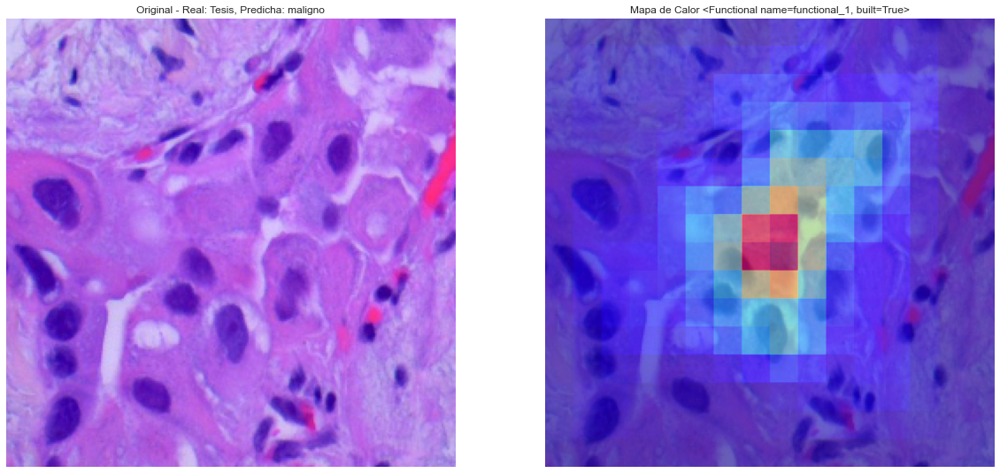

Entrenando el modelo vgg...
Epoch 1/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 655s 1s/step - accuracy: 0.9685 - loss: 0.1033 - val_accuracy: 0.9969 - val_loss: 0.0113
Epoch 2/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 653s 1s/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.9987 - val_loss: 0.0049
Epoch 3/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 654s 1s/step - accuracy: 0.9985 - loss: 0.0054 - val_accuracy: 0.9791 - val_loss: 0.0439
Epoch 4/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 653s 1s/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.9973 - val_loss: 0.0062
Epoch 5/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 654s 1s/step - accuracy: 0.9988 - loss: 0.0039 - val_accuracy: 0.9987 - val_loss: 0.0023
Epoch 6/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 653s 1s/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.9991 - val_loss: 0.0024
Epoch 7/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 653s 1s/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 1.0000 - val_loss: 5.5249e-04
Epoch 8/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 653s 1s/step - accuracy: 

Modelo vgg entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 104s 915ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 34s 906ms/step
Final Validation Metrics for vgg: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for vgg: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_33900\3770877051.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


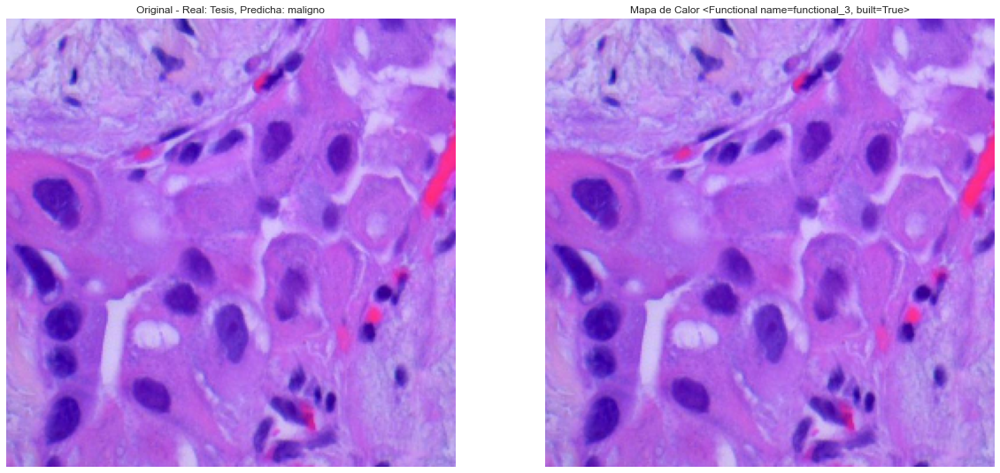

Entrenando el modelo densenet...
Epoch 1/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 328s 539ms/step - accuracy: 0.9835 - loss: 0.0289 - val_accuracy: 0.9996 - val_loss: 0.0015
Epoch 2/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 311s 519ms/step - accuracy: 0.9997 - loss: 6.3044e-04 - val_accuracy: 1.0000 - val_loss: 2.8927e-04
Epoch 3/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 313s 522ms/step - accuracy: 1.0000 - loss: 1.6795e-04 - val_accuracy: 0.9996 - val_loss: 4.1850e-04
Epoch 4/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 312s 519ms/step - accuracy: 1.0000 - loss: 3.6557e-05 - val_accuracy: 1.0000 - val_loss: 1.8412e-04
Epoch 5/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 313s 522ms/step - accuracy: 1.0000 - loss: 2.0327e-05 - val_accuracy: 1.0000 - val_loss: 2.4261e-04
Epoch 6/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 311s 518ms/step - accuracy: 1.0000 - loss: 1.5485e-05 - val_accuracy: 1.0000 - val_loss: 2.8940e-04
Epoch 7/30
600/600 ━━━━━━━━━━━━━━━━━━━━ 312s 520ms/step - accuracy: 1.0000 - loss: 1.3401e-05 - val_accuracy: 1.0000 - val_loss: 9.9849

Modelo densenet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 53s 454ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 16s 432ms/step
Final Validation Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_33900\3770877051.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


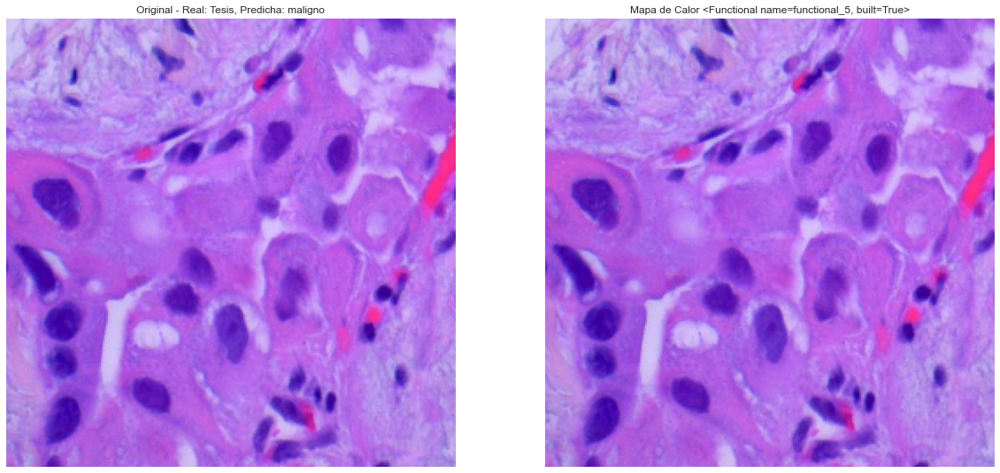

In [5]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_pulmon, df_val_pulmon, df_test_pulmon = dividir_dataframe(df_pulmon)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_pulmon, df_val_pulmon)
test_gen = crear_generador_test(df_test_pulmon)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'lung', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_pulmon['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Gastrointestinal

In [6]:
df_gastrointestinal = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='gastrointestinal')
train_loader_gastrointestinal, val_loader_gastrointestinal, test_loader_gastrointestinal = qol.prepare_data_loaders(df_gastrointestinal, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_gastrointestinal, test_size=0.3, random_state=46, stratify=df_gastrointestinal['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\gastrointestinal_ACA_TUM-AMVQVFMTFLID.png


In [7]:

# Entrenar modelo
model_bmgg= bmgg.train_model(device, train_loader_gastrointestinal, val_loader_gastrointestinal)
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pth')
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgg, test_loader_gastrointestinal)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgc, val_loader_gastrointestinal, test_loader_gastrointestinal)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\gastrointestinal_ACA_TUM-SGLWGNGATKMW.png
Validation Accuracy: 0.9708
Test Accuracy: 0.9646
Final Test Accuracy: 0.9646
error


In [7]:
# Definir el estudio
try:
    study_gastrointestinal = optuna.create_study(storage="sqlite:///gastrointestinal_model_opt_deep.db", study_name="Estudio Clasificador Gastrointestinal Deep",direction='maximize')
    study_gastrointestinal.optimize(lambda trial: opt_deep.objective(trial, cancer='gastrointestinal'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_gastrointestinal.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_gastrointestinal:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'gastrointestinal_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_gastrointestinal:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('gastrointestinal_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_gastrointestinal:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-08-12 06:03:34,578] A new study created in RDB with name: Estudio Clasificador Gastrointestinal Deep
[I 2024-08-12 06:11:07,783] Trial 0 finished with value: 0.43938976823106746 and parameters: {'num_layers': 4, 'num_fc_layers': 2, 'num_filters_layer0': 128, 'num_filters_layer1': 64, 'num_filters_layer2': 64, 'num_filters_layer3': 32, 'kernel_size': 3, 'dropout_rate': 0.3094966712845716, 'learning_rate': 0.00013982000484868767, 'batch_size': 30, 'steps_per_epoch': 131, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.43938976823106746.
[I 2024-08-12 06:15:19,781] Trial 1 finished with value: 0.1998109926213371 and parameters: {'num_layers': 7, 'num_fc_layers': 1, 'num_filters_layer0': 32, 'num_filters_layer1': 64, 'num_filters_layer2': 128, 'num_filters_layer3': 128, 'num_filters_layer4': 64, 'num_filters_layer5': 128, 'num_filters_layer6': 32, 'kernel_size': 2, 'dropout_rate': 0.2473448183615431, 'learning_rate': 0.00012559409110295374, 'batch_size': 20, 'steps_per_epoch': 1

Final Test Accuracy: 0.9457
Final Test Recall: 0.9457
Final Test Precision: 0.9481
Final Test F1 Score: 0.9456


### Redes preentrenadas

DataFrames divididos con éxito
Found 6400 validated image filenames belonging to 2 classes.
Found 1200 validated image filenames belonging to 2 classes.
Found 400 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/30


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


320/320 ━━━━━━━━━━━━━━━━━━━━ 150s 458ms/step - accuracy: 0.6720 - loss: 0.6314 - val_accuracy: 0.6917 - val_loss: 0.6009
Epoch 2/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.7339 - loss: 0.5316 - val_accuracy: 0.7308 - val_loss: 0.5293
Epoch 3/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 144s 449ms/step - accuracy: 0.7586 - loss: 0.5044 - val_accuracy: 0.7450 - val_loss: 0.5016
Epoch 4/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 144s 449ms/step - accuracy: 0.7664 - loss: 0.4898 - val_accuracy: 0.7708 - val_loss: 0.5171
Epoch 5/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 144s 449ms/step - accuracy: 0.7751 - loss: 0.4844 - val_accuracy: 0.7825 - val_loss: 0.4447
Epoch 6/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 449ms/step - accuracy: 0.7907 - loss: 0.4531 - val_accuracy: 0.7675 - val_loss: 0.4600
Epoch 7/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 144s 448ms/step - accuracy: 0.8035 - loss: 0.4290 - val_accuracy: 0.7842 - val_loss: 0.4283
Epoch 8/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.8015 - loss: 0.43

Modelo resnet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 387ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 389ms/step
Final Validation Metrics for resnet: Accuracy=0.8100, Recall=0.9286, Precision=0.7566, F1=0.8338
Final Test Metrics for resnet: Accuracy=0.8050, Recall=0.9096, Precision=0.7371, F1=0.8143


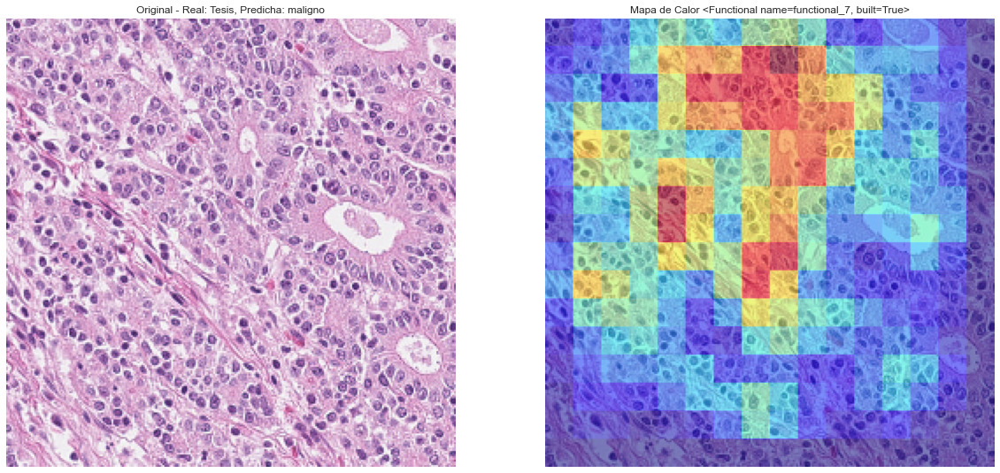

Entrenando el modelo vgg...
Epoch 1/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 349s 1s/step - accuracy: 0.9205 - loss: 0.1943 - val_accuracy: 0.9825 - val_loss: 0.0514
Epoch 2/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - accuracy: 0.9807 - loss: 0.0517 - val_accuracy: 0.9867 - val_loss: 0.0502
Epoch 3/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 349s 1s/step - accuracy: 0.9856 - loss: 0.0381 - val_accuracy: 0.9650 - val_loss: 0.1005
Epoch 4/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 349s 1s/step - accuracy: 0.9845 - loss: 0.0363 - val_accuracy: 0.9792 - val_loss: 0.0527
Epoch 5/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - accuracy: 0.9878 - loss: 0.0328 - val_accuracy: 0.9908 - val_loss: 0.0300
Epoch 6/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - accuracy: 0.9877 - loss: 0.0322 - val_accuracy: 0.9875 - val_loss: 0.0325
Epoch 7/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - accuracy: 0.9904 - loss: 0.0227 - val_accuracy: 0.9775 - val_loss: 0.0586
Epoch 8/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 348s 1s/step - accuracy: 0.98

Modelo vgg entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 917ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 912ms/step
Final Validation Metrics for vgg: Accuracy=0.9908, Recall=0.9821, Precision=1.0000, F1=0.9910
Final Test Metrics for vgg: Accuracy=0.9925, Recall=0.9840, Precision=1.0000, F1=0.9920


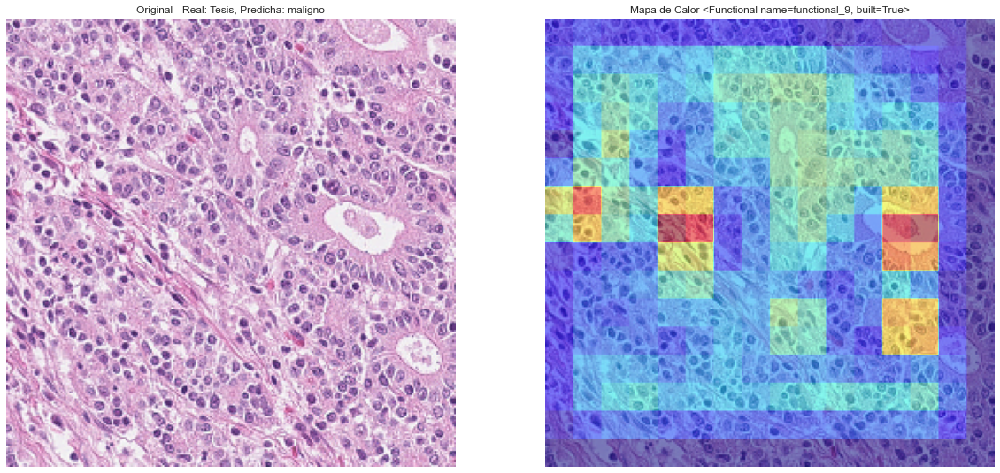

Entrenando el modelo densenet...
Epoch 1/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 187s 564ms/step - accuracy: 0.9616 - loss: 0.0833 - val_accuracy: 0.9925 - val_loss: 0.0171
Epoch 2/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 178s 555ms/step - accuracy: 0.9943 - loss: 0.0170 - val_accuracy: 0.9808 - val_loss: 0.0578
Epoch 3/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 179s 556ms/step - accuracy: 0.9951 - loss: 0.0144 - val_accuracy: 0.9942 - val_loss: 0.0153
Epoch 4/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 178s 554ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.9942 - val_loss: 0.0206
Epoch 5/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 178s 553ms/step - accuracy: 0.9947 - loss: 0.0163 - val_accuracy: 0.9958 - val_loss: 0.0093
Epoch 6/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 179s 556ms/step - accuracy: 0.9955 - loss: 0.0111 - val_accuracy: 0.9958 - val_loss: 0.0118
Epoch 7/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 179s 556ms/step - accuracy: 0.9982 - loss: 0.0052 - val_accuracy: 0.9942 - val_loss: 0.0145
Epoch 8/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 179

Modelo densenet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 34s 521ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 512ms/step
Final Validation Metrics for densenet: Accuracy=0.9942, Recall=0.9886, Precision=1.0000, F1=0.9943
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


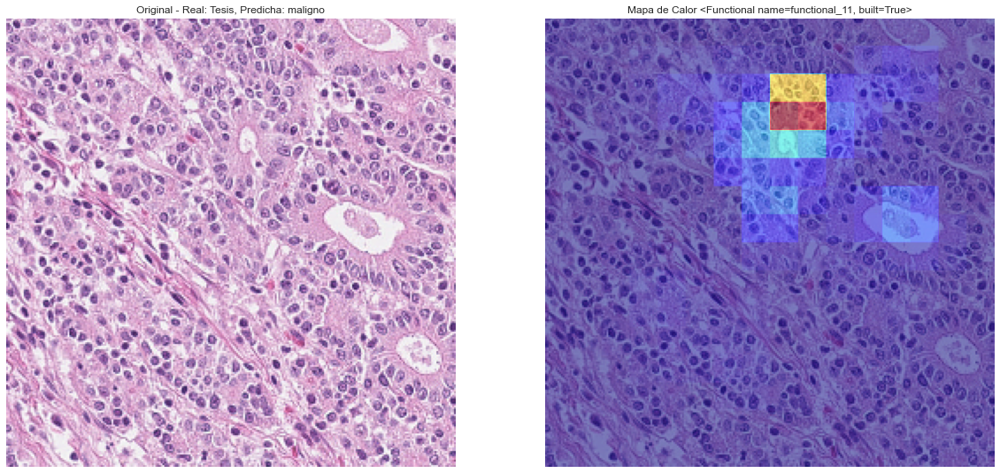

In [7]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_gastrointestinal, df_val_gastrointestinal, df_test_gastrointestinal = dividir_dataframe(df_gastrointestinal)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_gastrointestinal, df_val_gastrointestinal)
test_gen = crear_generador_test(df_test_gastrointestinal)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'gastrointestinal', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_gastrointestinal['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Oral

In [8]:
df_oral = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='oral')
train_loader_oral, val_loader_oral, test_loader_oral = qol.prepare_data_loaders(df_oral, batch_size=20, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_oral, test_size=0.3, random_state=46, stratify=df_oral['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\oral_benigno_Normal_100x_36_1


In [9]:

# Entrenar modelo
model_bmgo= bmgo.train_model(device, train_loader_oral, val_loader_oral)
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pth')
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgo, test_loader_oral)
print(f'Final Test Accuracy: {test_accuracy:.4f}')



try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgo, val_loader_oral, test_loader_oral)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\oral_benigno_Normal_400x_200_1_f4d0e137-08ae-4db9-ac25-31bd8726ef04_1.JPEG
Validation Accuracy: 0.7979
Test Accuracy: 0.8066
Final Test Accuracy: 0.8066
Validation Accuracy: 0.7979
Test Accuracy: 0.8066
Final Validation Metrics: Accuracy=0.7979, Recall=0.6190, Precision=0.7444, F1=0.6371
Final Test Metrics: Accuracy=0.8066, Recall=0.6212, Precision=0.7849, F1=0.6410


In [9]:
# Definir el estudio
try:
    study_oral= optuna.create_study(storage="sqlite:///oral_model_opt_deep.db", study_name="Estudio Clasificador Oral Deep",direction='maximize')
    study_oral.optimize(lambda trial: opt_deep.objective(trial, cancer='oral'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_oral.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_oral:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'oral_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_oral:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('oral_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_oral:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-08-12 18:13:42,420] A new study created in RDB with name: Estudio Clasificador Oral Deep
[I 2024-08-12 18:38:04,822] Trial 0 finished with value: 0.7739883669525116 and parameters: {'num_layers': 1, 'num_fc_layers': 3, 'num_filters_layer0': 64, 'kernel_size': 3, 'dropout_rate': 0.19823157883236295, 'learning_rate': 0.0030751380814610157, 'batch_size': 20, 'steps_per_epoch': 199, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.7739883669525116.
[I 2024-08-12 18:44:40,561] Trial 1 finished with value: 0.8235511750452807 and parameters: {'num_layers': 8, 'num_fc_layers': 1, 'num_filters_layer0': 64, 'num_filters_layer1': 64, 'num_filters_layer2': 128, 'num_filters_layer3': 64, 'num_filters_layer4': 64, 'num_filters_layer5': 64, 'num_filters_layer6': 32, 'num_filters_layer7': 64, 'kernel_size': 2, 'dropout_rate': 0.3411770755898611, 'learning_rate': 0.002318205285782489, 'batch_size': 30, 'steps_per_epoch': 144, 'optimizer': 'RMSprop'}. Best is trial 1 with value: 0.823551175045

Error during optimization: CUDA out of memory. Tried to allocate 1.89 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 19.86 GiB is allocated by PyTorch, and 811.42 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Error during model evaluation: CUDA out of memory. Tried to allocate 646.00 MiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 20.29 GiB is allocated by PyTorch, and 1.49 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Failed to load the last best model: [Errno 2] No such file or directory: 'oral_model_opt_deep.pth'


### Redes Preentrenadas

DataFrames divididos con éxito
Found 9790 validated image filenames belonging to 2 classes.
Found 1841 validated image filenames belonging to 2 classes.
Found 609 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 981 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 178 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 65 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/30


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


490/490 ━━━━━━━━━━━━━━━━━━━━ 250s 503ms/step - accuracy: 0.7446 - loss: 0.6194 - val_accuracy: 0.7632 - val_loss: 0.5317
Epoch 2/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 242s 494ms/step - accuracy: 0.7474 - loss: 0.5668 - val_accuracy: 0.7648 - val_loss: 0.5503
Epoch 3/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 237s 484ms/step - accuracy: 0.7616 - loss: 0.5448 - val_accuracy: 0.7626 - val_loss: 0.5323
Epoch 4/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 239s 488ms/step - accuracy: 0.7563 - loss: 0.5504 - val_accuracy: 0.7626 - val_loss: 0.5374
Epoch 5/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 248s 506ms/step - accuracy: 0.7651 - loss: 0.5387 - val_accuracy: 0.7626 - val_loss: 0.5371
Epoch 6/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 251s 512ms/step - accuracy: 0.7654 - loss: 0.5391 - val_accuracy: 0.7626 - val_loss: 0.5381
Epoch 7/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 227s 463ms/step - accuracy: 0.7593 - loss: 0.5418 - val_accuracy: 0.7626 - val_loss: 0.5369
Epoch 8/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 226s 460ms/step - accuracy: 0.7706 - loss: 0.52

Modelo resnet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 40s 421ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 13s 415ms/step
Final Validation Metrics for resnet: Accuracy=0.7626, Recall=1.0000, Precision=0.7626, F1=0.8653
Final Test Metrics for resnet: Accuracy=0.7685, Recall=1.0000, Precision=0.7685, F1=0.8691


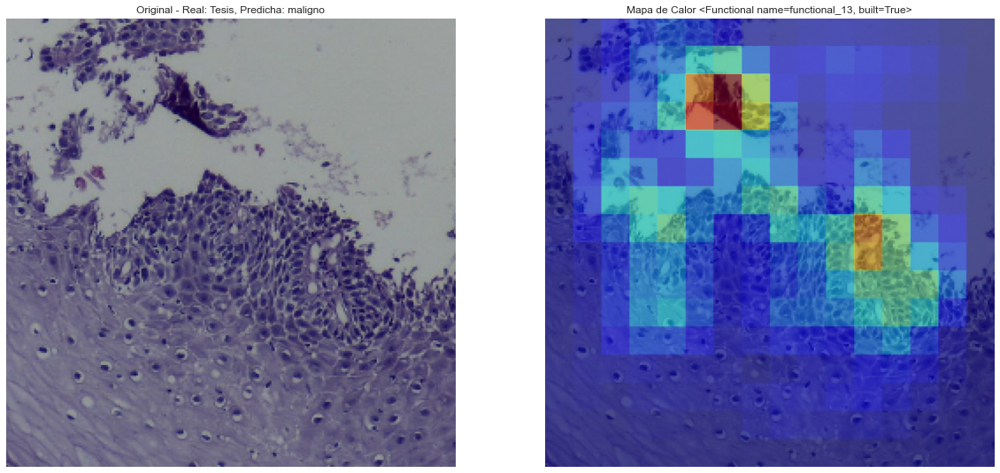

Entrenando el modelo vgg...
Epoch 1/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 528s 1s/step - accuracy: 0.7572 - loss: 0.5006 - val_accuracy: 0.7708 - val_loss: 0.4523
Epoch 2/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 527s 1s/step - accuracy: 0.7938 - loss: 0.4262 - val_accuracy: 0.7806 - val_loss: 0.4259
Epoch 3/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 526s 1s/step - accuracy: 0.8137 - loss: 0.3925 - val_accuracy: 0.8398 - val_loss: 0.3686
Epoch 4/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 527s 1s/step - accuracy: 0.8403 - loss: 0.3609 - val_accuracy: 0.7599 - val_loss: 0.4630
Epoch 5/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 527s 1s/step - accuracy: 0.8453 - loss: 0.3494 - val_accuracy: 0.8398 - val_loss: 0.3446
Epoch 6/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 526s 1s/step - accuracy: 0.8515 - loss: 0.3274 - val_accuracy: 0.8664 - val_loss: 0.2975
Epoch 7/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 526s 1s/step - accuracy: 0.8694 - loss: 0.3034 - val_accuracy: 0.8561 - val_loss: 0.3086
Epoch 8/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 526s 1s/step - accuracy: 0.88

Modelo vgg entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 84s 896ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 28s 895ms/step
Final Validation Metrics for vgg: Accuracy=0.9468, Recall=0.9808, Precision=0.9510, F1=0.9656
Final Test Metrics for vgg: Accuracy=0.9557, Recall=0.9872, Precision=0.9565, F1=0.9716


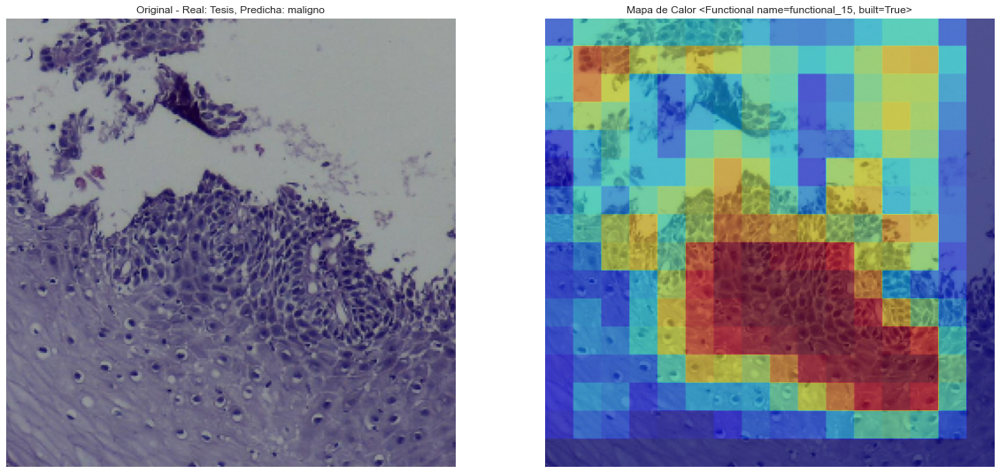

Entrenando el modelo densenet...
Epoch 1/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 603ms/step - accuracy: 0.7912 - loss: 0.4416 - val_accuracy: 0.8599 - val_loss: 0.3210
Epoch 2/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 291s 593ms/step - accuracy: 0.8923 - loss: 0.2599 - val_accuracy: 0.9180 - val_loss: 0.2165
Epoch 3/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 291s 593ms/step - accuracy: 0.9265 - loss: 0.1923 - val_accuracy: 0.9278 - val_loss: 0.1766
Epoch 4/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 290s 592ms/step - accuracy: 0.9486 - loss: 0.1430 - val_accuracy: 0.9202 - val_loss: 0.1851
Epoch 5/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 291s 593ms/step - accuracy: 0.9503 - loss: 0.1243 - val_accuracy: 0.9413 - val_loss: 0.1472
Epoch 6/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 290s 592ms/step - accuracy: 0.9644 - loss: 0.0974 - val_accuracy: 0.9522 - val_loss: 0.1199
Epoch 7/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 291s 593ms/step - accuracy: 0.9792 - loss: 0.0690 - val_accuracy: 0.9587 - val_loss: 0.1077
Epoch 8/30
490/490 ━━━━━━━━━━━━━━━━━━━━ 290

Modelo densenet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 502ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 479ms/step
Final Validation Metrics for densenet: Accuracy=0.9701, Recall=0.9822, Precision=0.9787, F1=0.9804
Final Test Metrics for densenet: Accuracy=0.9639, Recall=0.9701, Precision=0.9827, F1=0.9763


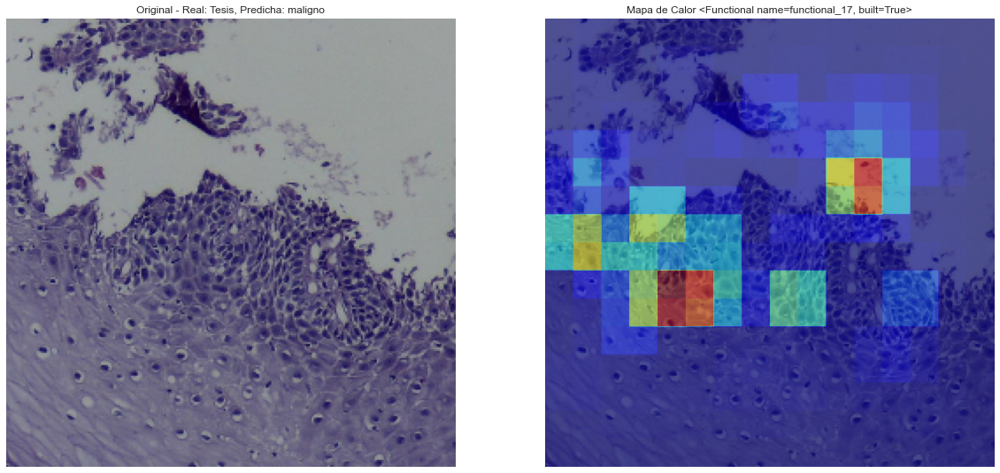

In [9]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_oral, df_val_oral, df_test_oral = dividir_dataframe(df_oral)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_oral, df_val_oral)
test_gen = crear_generador_test(df_test_oral)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'oral', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_oral['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)